In [37]:
import pandas as pd
import numpy as np
import datetime
import warnings

warnings.filterwarnings('ignore')
warnings.filterwarnings("ignore", message="numpy.ufunc size changed")

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

pd.set_option('display.max_columns', None)

In [38]:
data = pd.read_csv('we_fn_use_c_marketing_customer_value_analysis.csv')
print(data.shape)
data.head()

(9134, 24)


,Customer,State,Customer Lifetime Value,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
0,BU79786,Washington,2763.519279,No,Basic,Bachelor,2/24/11,Employed,F,56274,Suburban,Married,69,32,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize
1,QZ44356,Arizona,6979.535903,No,Extended,Bachelor,1/31/11,Unemployed,F,0,Suburban,Single,94,13,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935,Four-Door Car,Medsize
2,AI49188,Nevada,12887.431650,No,Premium,Bachelor,2/19/11,Employed,F,48767,Suburban,Married,108,18,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.472247,Two-Door Car,Medsize
3,WW63253,California,7645.861827,No,Basic,Bachelor,1/20/11,Unemployed,M,0,Suburban,Married,106,18,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344,SUV,Medsize
4,HB64268,Washington,2813.692575,No,Basic,Bachelor,2/3/11,Employed,M,43836,Rural,Single,73,12,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.130879,Four-Door Car,Medsize


In [39]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9134 entries, 0 to 9133
Data columns (total 24 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Customer                       9134 non-null   object 
 1   State                          9134 non-null   object 
 2   Customer Lifetime Value        9134 non-null   float64
 3   Response                       9134 non-null   object 
 4   Coverage                       9134 non-null   object 
 5   Education                      9134 non-null   object 
 6   Effective To Date              9134 non-null   object 
 7   EmploymentStatus               9134 non-null   object 
 8   Gender                         9134 non-null   object 
 9   Income                         9134 non-null   int64  
 10  Location Code                  9134 non-null   object 
 11  Marital Status                 9134 non-null   object 
 12  Monthly Premium Auto           9134 non-null   i

In [40]:
data.columns

Index(['Customer', 'State', 'Customer Lifetime Value', 'Response', 'Coverage',
       'Education', 'Effective To Date', 'EmploymentStatus', 'Gender',
       'Income', 'Location Code', 'Marital Status', 'Monthly Premium Auto',
       'Months Since Last Claim', 'Months Since Policy Inception',
       'Number of Open Complaints', 'Number of Policies', 'Policy Type',
       'Policy', 'Renew Offer Type', 'Sales Channel', 'Total Claim Amount',
       'Vehicle Class', 'Vehicle Size'],
      dtype='object')

In [41]:
new_columns = {
    'Customer': 'customer',
    'State': 'state',
    'Customer Lifetime Value': 'customer_lifetime_value',
    'Response': 'response',
    'Coverage': 'coverage',
    'Education': 'education',
    'Effective To Date': 'effective_to_date',
    'EmploymentStatus': 'employment_status',
    'Gender': 'gender',
    'Income': 'income',
    'Location Code': 'location_code',
    'Marital Status': 'marital_status',
    'Monthly Premium Auto': 'monthly_premium_auto',
    'Months Since Last Claim': 'months_since_last_claim',
    'Months Since Policy Inception': 'months_since_policy_inception',
    'Number of Open Complaints': 'number_of_open_complaints',
    'Number of Policies': 'number_of_policies',
    'Policy Type': 'policy_type',
    'Policy': 'policy',
    'Renew Offer Type': 'renew_offer_type',
    'Sales Channel': 'sales_channel',
    'Total Claim Amount': 'total_claim_amount',
    'Vehicle Class': 'vehicle_class',
    'Vehicle Size': 'vehicle_size'
}

data.rename(columns=new_columns, inplace=True)


In [42]:
data.columns

Index(['customer', 'state', 'customer_lifetime_value', 'response', 'coverage',
       'education', 'effective_to_date', 'employment_status', 'gender',
       'income', 'location_code', 'marital_status', 'monthly_premium_auto',
       'months_since_last_claim', 'months_since_policy_inception',
       'number_of_open_complaints', 'number_of_policies', 'policy_type',
       'policy', 'renew_offer_type', 'sales_channel', 'total_claim_amount',
       'vehicle_class', 'vehicle_size'],
      dtype='object')

In [43]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9134 entries, 0 to 9133
Data columns (total 24 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   customer                       9134 non-null   object 
 1   state                          9134 non-null   object 
 2   customer_lifetime_value        9134 non-null   float64
 3   response                       9134 non-null   object 
 4   coverage                       9134 non-null   object 
 5   education                      9134 non-null   object 
 6   effective_to_date              9134 non-null   object 
 7   employment_status              9134 non-null   object 
 8   gender                         9134 non-null   object 
 9   income                         9134 non-null   int64  
 10  location_code                  9134 non-null   object 
 11  marital_status                 9134 non-null   object 
 12  monthly_premium_auto           9134 non-null   i

In [44]:
data.transpose()

0              1              2     \
customer                              BU79786        QZ44356        AI49188   
state                              Washington        Arizona         Nevada   
customer_lifetime_value           2763.519279    6979.535903    12887.43165   
response                                   No             No             No   
coverage                                Basic       Extended        Premium   
education                            Bachelor       Bachelor       Bachelor   
effective_to_date                     2/24/11        1/31/11        2/19/11   
employment_status                    Employed     Unemployed       Employed   
gender                                      F              F              F   
income                                  56274              0          48767   
location_code                        Suburban       Suburban       Suburban   
marital_status                        Married         Single        Married   
monthly_premium_auto                       69             94            108   
months_since_last_claim                    32             13             18   
months_since_policy_inception               5             42             38   
number_of_open_complaints                   0              0              0   
number_of_policies                          1              8              2   
policy_type                    Corporate Auto  Personal Auto  Personal Auto   
policy                           Corporate L3    Personal L3    Personal L3   
renew_offer_type                       Offer1         Offer3         Offer1   
sales_channel                           Agent          Agent          Agent   
total_claim_amount                 384.811147    1131.464935     566.472247   
vehicle_class                    Two-Door Car  Four-Door Car   Two-Door Car   
vehicle_size                          Medsize        Medsize        Medsize   

                                         3              4              5     \
customer                              WW63253        HB64268        OC83172   
state                              California     Washington         Oregon   
customer_lifetime_value           7645.861827    2813.692575      8256.2978   
response                                   No             No            Yes   
coverage                                Basic          Basic          Basic   
education                            Bachelor       Bachelor       Bachelor   
effective_to_date                     1/20/11         2/3/11        1/25/11   
employment_status                  Unemployed       Employed       Employed   
gender                                      M              M              F   
income                                      0          43836          62902   
location_code                        Suburban          Rural          Rural   
marital_status                        Married         Single        Married   
monthly_premium_auto                      106             73             69   
months_since_last_claim                    18             12             14   
months_since_policy_inception              65             44             94   
number_of_open_complaints                   0              0              0   
number_of_policies                          7              1              2   
policy_type                    Corporate Auto  Personal Auto  Personal Auto   
policy                           Corporate L2    Personal L1    Personal L3   
renew_offer_type                       Offer1         Offer1         Offer2   
sales_channel                     Call Center          Agent            Web   
total_claim_amount                 529.881344     138.130879     159.383042   
vehicle_class                             SUV  Four-Door Car   Two-Door Car   
vehicle_size                          Medsize        Medsize        Medsize   

                                         6               7               8     \
customer

In [45]:
unique_values = {}
for column in data.columns:
    unique_values[column] = data[column].unique()

print(unique_values)

{'customer': array(['BU79786', 'QZ44356', 'AI49188', ..., 'TD14365', 'UP19263',
       'Y167826'], dtype=object), 'state': array(['Washington', 'Arizona', 'Nevada', 'California', 'Oregon'],
      dtype=object), 'customer_lifetime_value': array([ 2763.519279,  6979.535903, 12887.43165 , ...,  8163.890428,
        7524.442436,  2611.836866]), 'response': array(['No', 'Yes'], dtype=object), 'coverage': array(['Basic', 'Extended', 'Premium'], dtype=object), 'education': array(['Bachelor', 'College', 'Master', 'High School or Below', 'Doctor'],
      dtype=object), 'effective_to_date': array(['2/24/11', '1/31/11', '2/19/11', '1/20/11', '2/3/11', '1/25/11',
       '1/18/11', '1/26/11', '2/17/11', '2/21/11', '1/6/11', '2/6/11',
       '1/10/11', '1/17/11', '1/5/11', '2/27/11', '1/14/11', '1/21/11',
       '2/5/11', '1/29/11', '2/28/11', '2/12/11', '2/2/11', '2/7/11',
       '1/22/11', '2/13/11', '1/15/11', '1/8/11', '1/11/11', '1/28/11',
       '2/8/11', '2/23/11', '1/2/11', '2/16/11', '1/27/

In [60]:
data['number_of_open_complaints'] = data['number_of_open_complaints'].astype('object')

# Convert 'Number of Policies' to categorical
data['number_of_policies'] = data['number_of_policies'].astype('object')

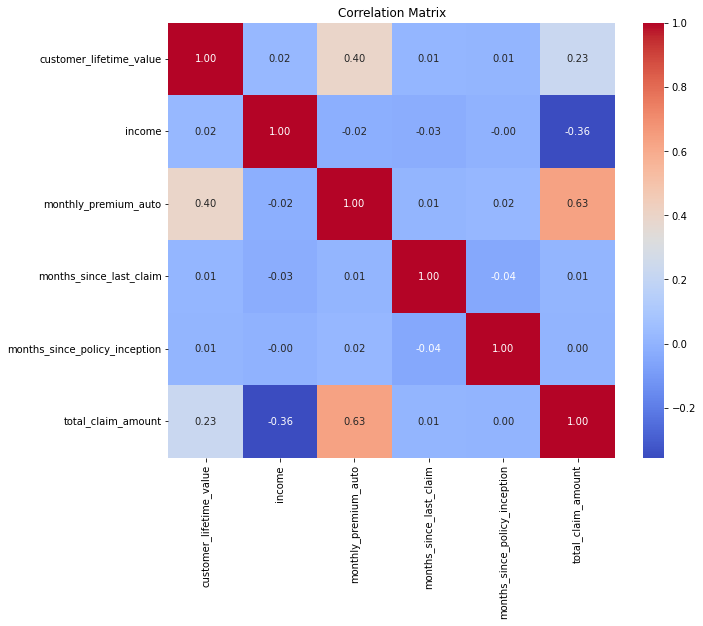

In [61]:

correlation_matrix = data.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={'size': 10})
plt.title('Correlation Matrix')
plt.show()


In [63]:
data.corr()

,customer_lifetime_value,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,total_claim_amount
customer_lifetime_value,1.000000,0.024366,0.396262,0.011517,0.009418,0.226451
income,0.024366,1.000000,-0.016665,-0.026715,-0.000875,-0.355254
monthly_premium_auto,0.396262,-0.016665,1.000000,0.005026,0.020257,0.632017
months_since_last_claim,0.011517,-0.026715,0.005026,1.000000,-0.042959,0.007563
months_since_policy_inception,0.009418,-0.000875,0.020257,-0.042959,1.000000,0.003335
total_claim_amount,0.226451,-0.355254,0.632017,0.007563,0.003335,1.000000


Customer Lifetime Value (CLV) shows a moderate positive correlation with Monthly Premium Auto (0.396262) and a weaker positive correlation with Total Claim Amount (0.226451). This suggests that as the CLV increases, the monthly premium and total claim amount tend to increase as well, although not strongly.

Income has a weak positive correlation with Customer Lifetime Value (0.024366), indicating that higher incomes may be associated with higher CLV. However, the correlation is not significant.

Monthly Premium Auto has a moderate positive correlation with Total Claim Amount (0.632017), suggesting that customers paying higher monthly premiums tend to file larger claim amounts.

Months Since Last Claim, Months Since Policy Inception, Number of Open Complaints, and Number of Policies have weak or negligible correlations with the other variables. These variables do not show strong linear relationships with the other variables in the dataset.

Income shows a negative correlation with Total Claim Amount (-0.355254). This suggests that higher incomes may be associated with lower claim amounts, indicating that individuals with higher incomes may file smaller claims.

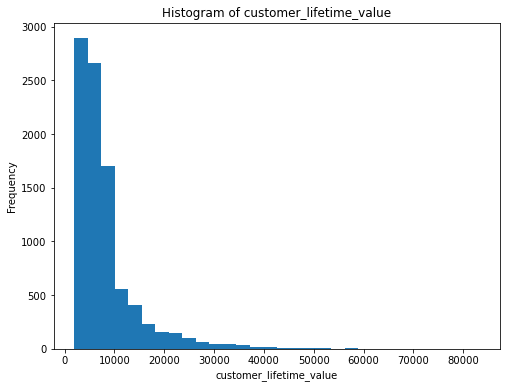

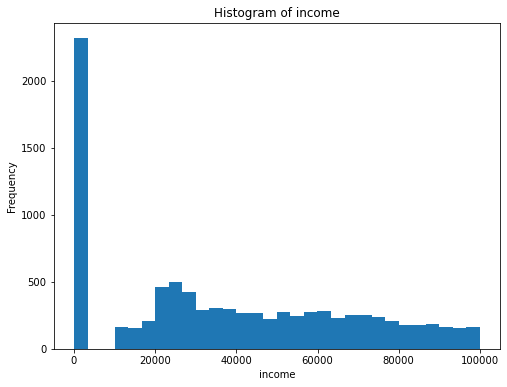

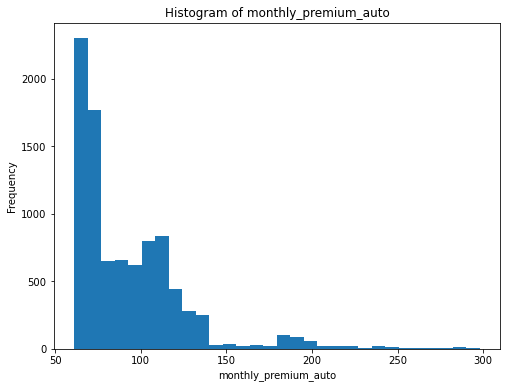

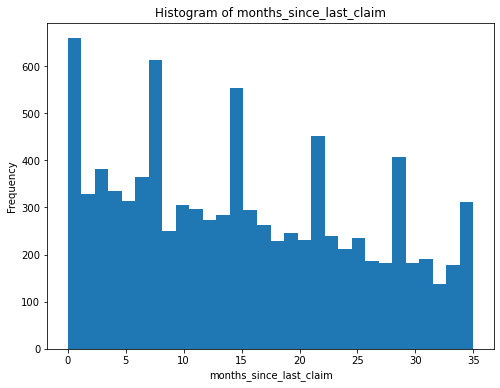

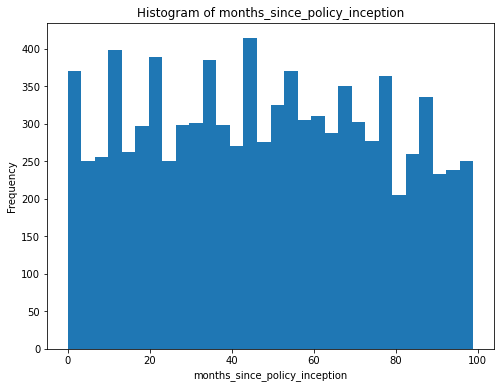

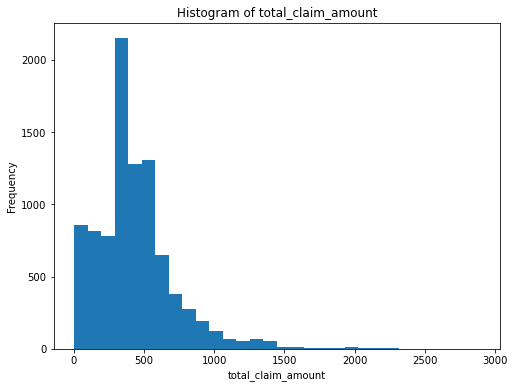

In [64]:
continuous_vars = data.select_dtypes(include=['float64', 'int64'])

for column in continuous_vars.columns:
    plt.figure(figsize=(8, 6))
    plt.hist(continuous_vars[column], bins=30)
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.title(f'Histogram of {column}')
    plt.show()

In [55]:
# Remove 'customer' column
data = data.drop('customer', axis=1)

KeyError: "['customer'] not found in axis"

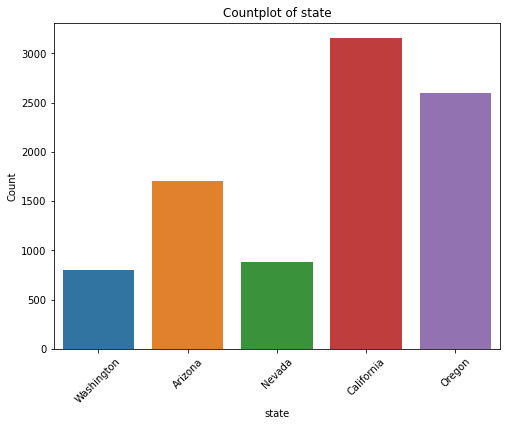

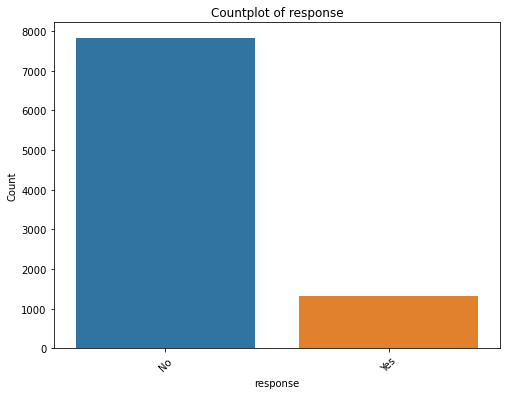

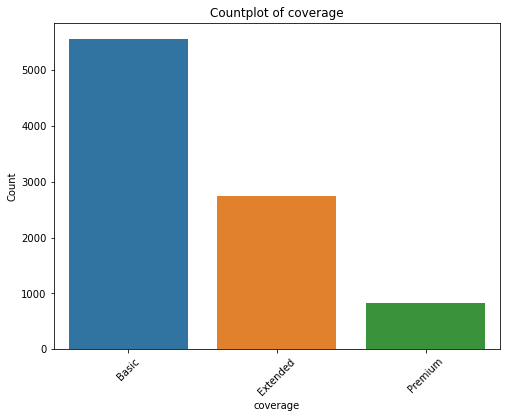

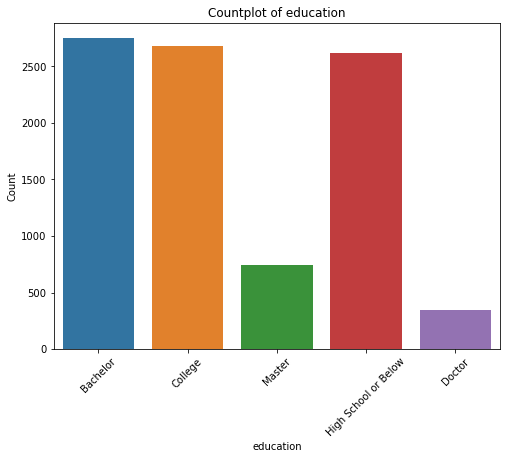

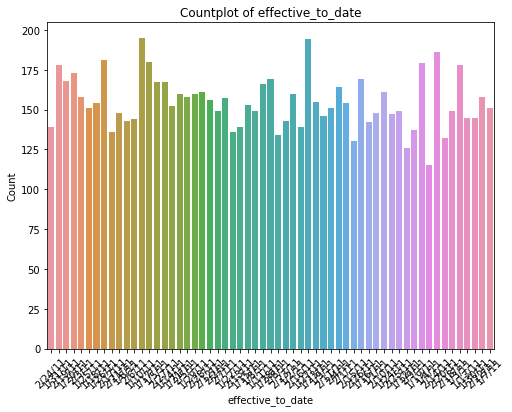

...

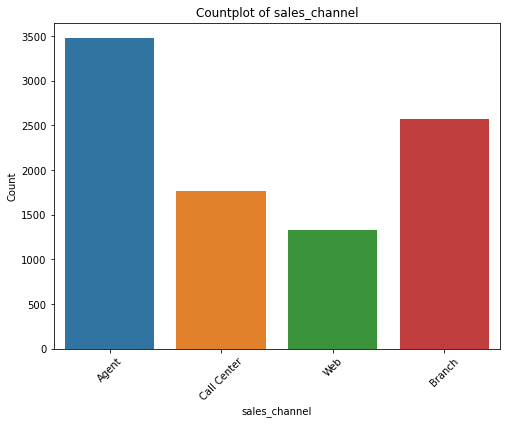

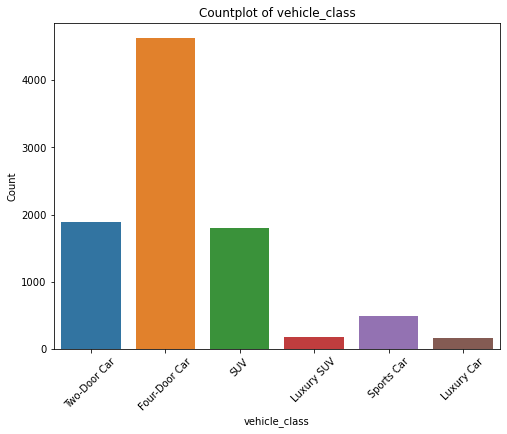

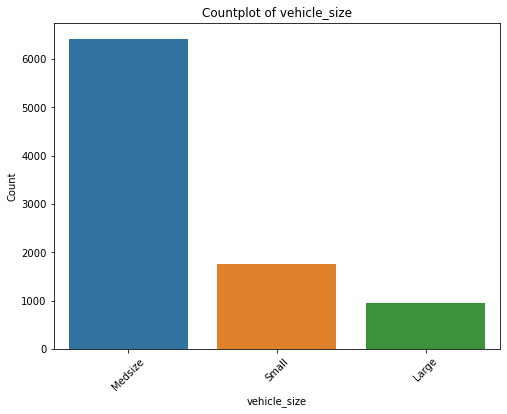

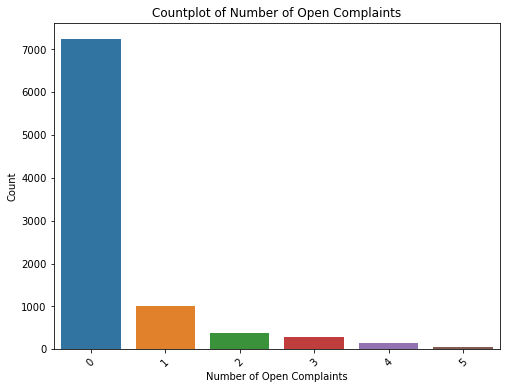

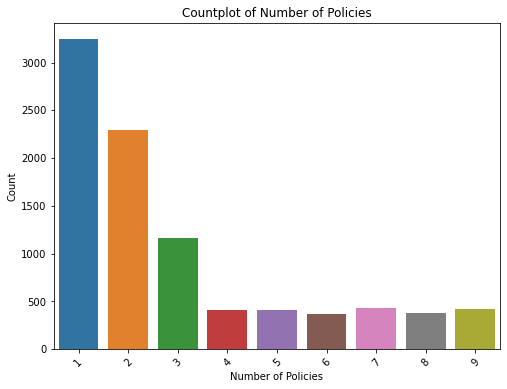

In [65]:
# Filter categorical variables
categorical_vars = data.select_dtypes(include=['object'])

# Plot each categorical variable
for column in categorical_vars.columns:
    plt.figure(figsize=(8, 6))
    sns.countplot(data=data, x=column)
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.title(f'Countplot of {column}')
    plt.xticks(rotation=45)
    plt.show()

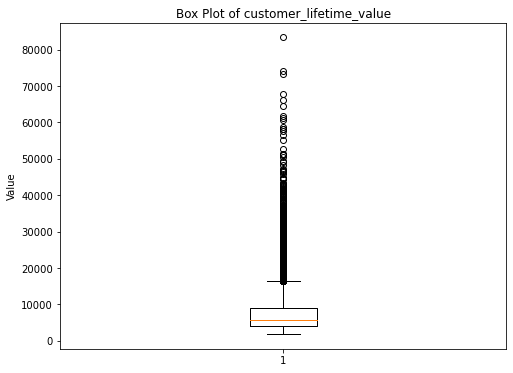

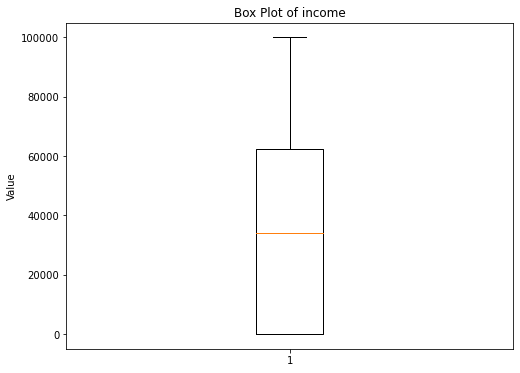

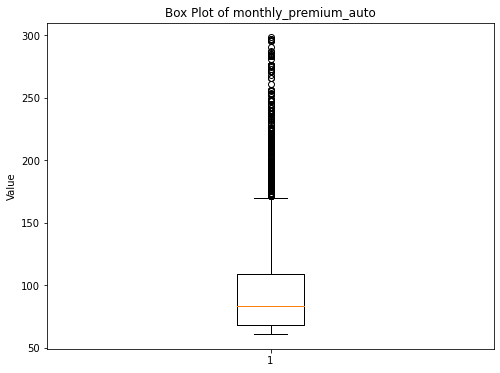

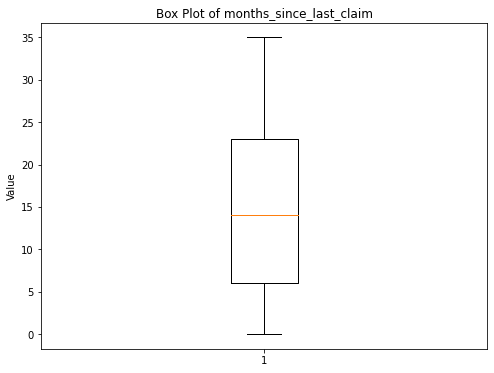

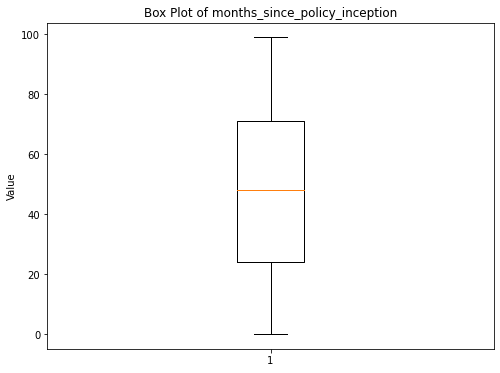

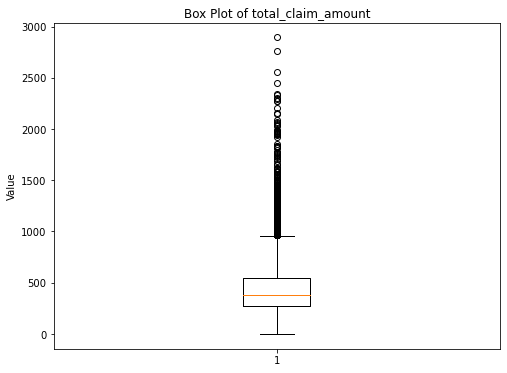

In [66]:
for column in continuous_vars.columns:
    plt.figure(figsize=(8, 6))
    plt.boxplot(continuous_vars[column])
    plt.title(f'Box Plot of {column}')
    plt.ylabel('Value')
    plt.show()

In [69]:
for column in continuous_vars.columns:
    data = continuous_vars[column]
    
    # Count the number of data points
    num_data_points = len(data)
    
    # Calculate quartiles
    quartiles = np.percentile(data, [25, 50, 75])
    
    # Calculate the interquartile range (IQR)
    iqr = quartiles[2] - quartiles[0]
    
    # Set the lower and upper bounds for outliers
    lower_bound = quartiles[0] - 1.5 * iqr
    upper_bound = quartiles[2] + 1.5 * iqr
    
    # Count the number of outliers
    num_outliers = len(data[(data < lower_bound) | (data > upper_bound)])
    
    print(f"Variable: {column}")
    print(f"Number of Data Points: {num_data_points}")
    print(f"Number of Outliers: {num_outliers}")
    print(f"Quartiles: {quartiles}\n")

Variable: customer_lifetime_value
Number of Data Points: 9134
Number of Outliers: 817
Quartiles: [3994.25179425 5780.182197   8962.16704125]

Variable: income
Number of Data Points: 9134
Number of Outliers: 0
Quartiles: [    0.  33889.5 62320. ]

Variable: monthly_premium_auto
Number of Data Points: 9134
Number of Outliers: 430
Quartiles: [ 68.  83. 109.]

Variable: months_since_last_claim
Number of Data Points: 9134
Number of Outliers: 0
Quartiles: [ 6. 14. 23.]

Variable: months_since_policy_inception
Number of Data Points: 9134
Number of Outliers: 0
Quartiles: [24. 48. 71.]

Variable: total_claim_amount
Number of Data Points: 9134
Number of Outliers: 453
Quartiles: [272.2582445  383.9454335  547.51483875]



The customer_lifetime_value variable has a relatively large number of outliers (817 out of 9134 data points), suggesting the presence of extreme values in the dataset. The quartiles indicate that 25% of the values fall below 3994.25, 50% fall below 5780.18 (median), and 75% fall below 8962.17.

The income variable has no outliers, indicating that all data points fall within the lower and upper bounds defined by the quartiles. The quartiles show that 25% of the incomes are below 33889.5, 50% are below 62320.0 (median), and 75% are below the upper quartile value of 62320.0.

The monthly_premium_auto variable has a considerable number of outliers (430 out of 9134 data points), indicating the presence of some extreme values. The quartiles show that 25% of the monthly premiums are below 68.0, 50% are below 83.0 (median), and 75% are below the upper quartile value of 109.0.

The months_since_last_claim variable has no outliers, indicating that all data points fall within the range defined by the quartiles. The quartiles suggest that 25% of the values fall below 6.0, 50% fall below 14.0 (median), and 75% fall below 23.0.

The months_since_policy_inception variable has no outliers, indicating that all data points fall within the lower and upper bounds defined by the quartiles. The quartiles suggest that 25% of the values fall below 24.0, 50% fall below 48.0 (median), and 75% fall below 71.0.

The total_claim_amount variable has a substantial number of outliers (453 out of 9134 data points), indicating the presence of some extreme values in the dataset. The quartiles suggest that 25% of the total claim amounts fall below 272.26


In [74]:
nan_columns = data.to_frame().columns[data.isna().any()].tolist()

if len(nan_columns) > 0:
    print("Columns with NaN values:")
    for column in nan_columns:
        num_nan = data[column].isna().sum()
        print(f"- {column}: {num_nan} NaN values")
else:
    print("No columns contain NaN values.")


No columns contain NaN values.
